# Исследование кластеризации по геоданным

In [1]:
import matplotlib.pyplot as plt


import pandas as pd
import numpy as np

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier

import hdbscan
import folium
import re


cols = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
        '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
        '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
        '#000075', '#808080']*10

### Импорт даннных

In [2]:
df = pd.read_csv('../data/processed/msk_2018_2021.csv')
df.shape


(378881, 20)

In [3]:
df.info()
type(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378881 entries, 0 to 378880
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0.1          378881 non-null  int64  
 1   Unnamed: 0            378881 non-null  int64  
 2   price                 378881 non-null  int64  
 3   date                  378881 non-null  object 
 4   time                  378881 non-null  object 
 5   geo_lat               378881 non-null  float64
 6   geo_lon               378881 non-null  float64
 7   building_type         378881 non-null  int64  
 8   level                 378881 non-null  int64  
 9   levels                378881 non-null  int64  
 10  rooms                 378881 non-null  int64  
 11  area                  378881 non-null  float64
 12  kitchen_area          378881 non-null  float64
 13  object_type           378881 non-null  int64  
 14  timestamp             378881 non-null  object 
 15  

pandas.core.frame.DataFrame

In [4]:
def del_rename_field(df : pd.DataFrame):
    df.drop('Unnamed: 0.1', axis=1, inplace=True)
    df.drop('Unnamed: 0', axis=1, inplace=True)
    df.drop('price', axis=1, inplace=True)
    df.drop('date', axis=1, inplace=True)
    df.drop('time', axis=1, inplace=True)
    df.drop('building_type', axis=1, inplace=True)
    df.drop('level', axis=1, inplace=True)
    df.drop('levels', axis=1, inplace=True)
    df.drop('area', axis=1, inplace=True)
    df.drop('kitchen_area', axis=1, inplace=True)
    df.drop('object_type', axis=1, inplace=True)
    df.drop('timestamp', axis=1, inplace=True)
    df.drop('target', axis=1, inplace=True)
    df.drop('year', axis=1, inplace=True)
    df.drop('month', axis=1, inplace=True)
    df.drop('distance_from_centre', axis=1, inplace=True)
    df.drop('rooms', axis=1, inplace=True)
    #df['NAME'] = df['district']
    df['LAT'] = df['geo_lat']
    df['LON'] = df['geo_lon']
    df.drop('geo_lat', axis=1, inplace=True)
    df.drop('geo_lon', axis=1, inplace=True)
    df.drop('district', axis=1, inplace=True)
    return df
def tranfororm_angle2km(df : pd.DataFrame):
    R = 6371.0 # км
    moscow_centre = (55.751003 * np.pi / 180.0, 37.617964 * np.pi / 180.0)  # перевод из градусов в радины
    df['X'] = df['LAT'].apply(lambda x: (x * np.pi / 180.0 - moscow_centre[0]) * R )
    df['Y'] = df['LON'].apply(lambda x: (x * np.pi / 180.0 - moscow_centre[1]) * R * np.cos(moscow_centre[0]) )
    return df

In [5]:
data = del_rename_field(df.copy())
data = tranfororm_angle2km(data)
data.head()

,LAT,LON,X,Y
0,55.621097,37.431002,-14.444944,-11.700003
1,55.738876,37.825370,-1.348461,12.979352
2,55.798921,37.738090,5.328294,7.517425
3,55.655307,37.614605,-10.640910,-0.210186
4,55.701330,37.507412,-5.523386,-6.918283


### Визуализация гео-данных

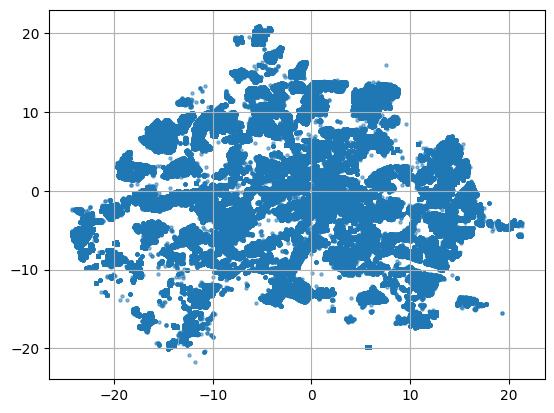

In [6]:
X = np.array(data[['X','Y']], dtype = 'float64')
plt.scatter(X[:,0], X[:,1], alpha=0.5, s = 5)
plt.grid(True)

In [7]:
plt_map=folium.Map(location=[data.LAT.mean(),data.LON.mean()],zoom_start=10,
             tiles='OpenStreetMap')
for _,row in data[:200].iterrows():
    folium.CircleMarker(
        location=[row.LAT,row.LON],
        radius=5,
        color='blue',
        fill=True
    ).add_to(plt_map)
plt_map

### K-Means Clustering

##### To find out the optimal number of clusters, I have used two metrics inertias and silhouette scores.Silhouetter scores range between -1 and 1 a silhouette score closer to one and greater than 0 indicates accurate clustering and sufficent distance between other clusters and itself.


In [16]:
k_range=range(5,50,5)
kmeans_per_k=[]
for k in k_range:
    kmeans=KMeans(n_clusters=k,random_state=42).fit(X)
    kmeans_per_k.append(kmeans)

best k value: 45
silhouette score: 0.4723689134904096


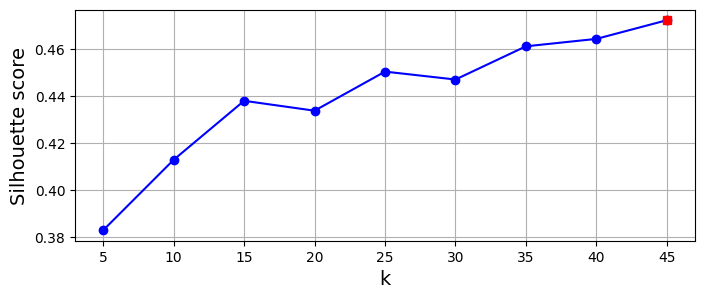

In [18]:
silh_scores=[silhouette_score(X[:5000,:],model.labels_[:5000]) for model in kmeans_per_k]
best_index = np.argmax(silh_scores)
best_k = k_range[best_index]
best_score = silh_scores[best_index]
print("best k value:",best_k)
print("silhouette score:",best_score)

plt.figure(figsize=(8, 3))
plt.grid(True)
plt.plot(k_range, silh_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.plot(best_k, best_score, "rs")
plt.show()

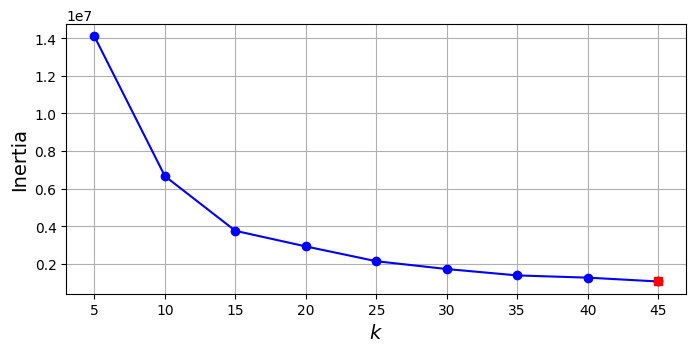

In [19]:
inertias = [model.inertia_ for model in kmeans_per_k]
best_inertia = inertias[best_index]

plt.figure(figsize=(8, 3.5))
plt.grid(True)
plt.plot(k_range, inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.plot(best_k, best_inertia, "rs")
plt.show()

In [8]:
k=15
model=KMeans(n_clusters=k,random_state=17).fit(X)
pred=model.predict(X)
data[f'CLUSTER_kmeans']=pred

In [9]:
data.head()

,LAT,LON,X,Y,CLUSTER_kmeans
0,55.621097,37.431002,-14.444944,-11.700003,0
1,55.738876,37.825370,-1.348461,12.979352,11
2,55.798921,37.738090,5.328294,7.517425,5
3,55.655307,37.614605,-10.640910,-0.210186,8
4,55.701330,37.507412,-5.523386,-6.918283,6


In [10]:
X

array([[-14.44494374, -11.70000298],
       [ -1.34846088,  12.97935209],
       [  5.32829409,   7.51742451],
       ...,
       [ 10.05335571,  -8.0314458 ],
       [  5.97484811,   8.31892325],
       [ 12.14655572,  -4.85667798]])

In [14]:
def create_map(data,cluster_col):
    m = folium.Map(location=[data.LAT.mean(), data.LON.mean()], zoom_start=9, tiles='openstreetmap')

    for _, row in data[:2000].iterrows():

        # get a colour
        if row[cluster_col]==-1:
            cluster_colour='black'
        else:
            cluster_colour = cols[int(row[cluster_col])]

        folium.CircleMarker(
            location=[row.LAT,row.LON],
            radius=5,
            popup= row[cluster_col],
            color=cluster_colour,
            fill=True,
            fill_color=cluster_colour
        ).add_to(m)
    return m

plt_map=create_map(data,'CLUSTER_kmeans')   
#print(f'Silhouette Score: {silhouette_score(X, pred)}')
plt_map.save('kmeans_map.html')
plt_map

### DBSCAN

In [ ]:
dummy = np.array([-1, -1, -1, 2, 3, 4, 5, -1])
new=np.array([(counter+2)*x if x==-1 else x for counter,x in enumerate(dummy)])


In [27]:
model=DBSCAN(eps=0.007,min_samples=15).fit(X)
class_predictions=model.labels_
data['Clusters_dbscan']=class_predictions
data.head()

,NAME,LAT,LON,CLUSTER_kmeans,Clusters_dbscan
0,поселение Московский,55.621097,37.431002,39,0
1,район Вешняки,55.738876,37.825370,28,1
2,Черкизово,55.798921,37.738090,44,1
3,Нагорный район,55.655307,37.614605,16,1
4,район Раменки,55.701330,37.507412,33,1


In [26]:
print(f'Number of clusters found: {len(np.unique(class_predictions))}')
print(f'Number of outliers found: {len(class_predictions[class_predictions==-1])}')

#print(f'Silhouette ignoring outliers: {silhouette_score(X[class_predictions!=-1], class_predictions[class_predictions!=-1])}')

no_outliers = 0
no_outliers = np.array([(counter+2)*x if x==-1 else x for counter, x in enumerate(class_predictions)])
#print(f'Silhouette outliers as singletons: {silhouette_score(X, no_outliers)}')
plt_map=create_map(data,'Clusters_dbscan')
plt_map.save('DBSCAN_map.html')
plt_map

Number of clusters found: 26
Number of outliers found: 133


### HDBSCAN

In [ ]:
model=hdbscan.HDBSCAN(min_cluster_size=5,min_samples=2,cluster_selection_epsilon=0.01)
class_predictions=model.fit_predict(X)
data['CLUSTER_hdbscan']=class_predictions
data.head()